# 1. Install and Import Dependencies

In [26]:
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113


In [27]:
!pip install stable-baselines3[extra] protobuf==3.20.*

In [28]:
!pip install mss pydirectinput pytesseract

In [29]:
#chrome://dino/

In [30]:
from mss import mss
import pydirectinput
import cv2
import numpy as np
import pytesseract
from matplotlib import pyplot as plt
import time
# from gym import Env
from gymnasium import Env
from gymnasium.spaces import Box, Discrete

# 2. Build the Environment

## 2.1 Create Environment

In [31]:
class WebGame(Env):
    def __init__(self):
        super().__init__()
        # Setup spaces
        self.observation_space = Box(low=0, high=255, shape=(1,83,100), dtype=np.uint8)
        self.action_space = Discrete(3)
        # Capture game frames
        self.cap = mss()
        self.game_location = {'top': 300, 'left': 0, 'width': 600, 'height': 500}
        self.done_location = {'top': 390, 'left': 630, 'width': 660, 'height': 70}
        
        
    def step(self, action):
        action_map = {
            0:'space',
            1: 'down', 
            2: 'no_op'
        }
        if action !=2:
            pydirectinput.PAUSE = 0.01
            pydirectinput.press(action_map[action])

        done, truncated, done_cap = self.get_done() 
        observation = self.get_observation()
        reward = 1 
        info = {}
        return observation, reward, done, truncated, info
        
    
    def reset(self, seed=None):
        time.sleep(0.1)
        pydirectinput.click(x=150, y=150)
        pydirectinput.press('space')
        info = {}
        return self.get_observation(), info
        
    def render(self):
        cv2.imshow('Game', self.current_frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            self.close()
         
    def close(self):
        cv2.destroyAllWindows()
    
    def get_observation(self):
        raw = np.array(self.cap.grab(self.game_location))[:,:,:3].astype(np.uint8)
        gray = cv2.cvtColor(raw, cv2.COLOR_BGR2GRAY)
        resized = cv2.resize(gray, (100,83))
        channel = np.reshape(resized, (1,83,100))
        return channel
    
    def get_done(self):
        done_cap = np.array(self.cap.grab(self.done_location))
        done_strings = ['GAME', 'GAHE', 'QaHe', "GARH"]
        done=False
        # if np.sum(done_cap) < 44300000:
        #     done = True
        done, truncated = False, False
        res = pytesseract.image_to_string(done_cap)[:4]
        if res in done_strings:
            done = True
        return done, truncated, done_cap

# 2.2 Test Environment

In [32]:
env = WebGame()

In [33]:
obs=env.get_observation()

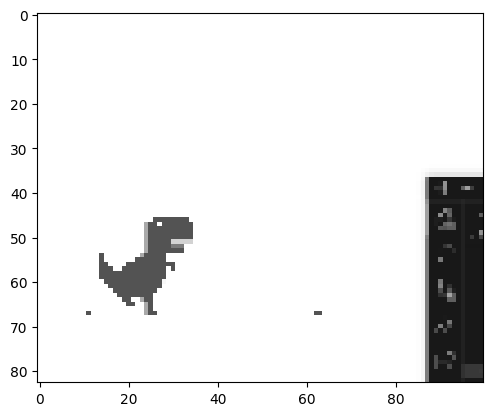

In [34]:
plt.imshow(cv2.cvtColor(obs[0], cv2.COLOR_GRAY2BGR))

In [35]:
pytesseract.pytesseract.tesseract_cmd = r'C:/Program Files/Tesseract-OCR/tesseract.exe'
done, truncated, done_cap = env.get_done()

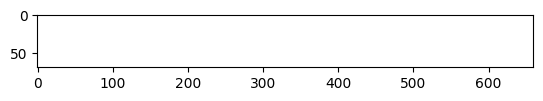

In [36]:
plt.imshow(done_cap)

In [37]:
pytesseract.image_to_string(done_cap)[:4]

''

In [38]:
done

False

In [39]:
# for episode in range(10): 
#     obs = env.reset()
#     done = False  
#     total_reward   = 0
#     while not done: 
#         obs, reward,  done, info =  env.step(env.action_space.sample())
#         total_reward  += reward
#     print('Total Reward for episode {} is {}'.format(episode, total_reward))    

# 3. Train the Model

## 3.1 Create Callback

In [40]:
# Import os for file path management
import os 
# Import Base Callback for saving models
from stable_baselines3.common.callbacks import BaseCallback
# Check Environment    
from stable_baselines3.common import env_checker

In [41]:
env_checker.check_env(env)

In [42]:
class TrainAndLoggingCallback(BaseCallback):

    def __init__(self, check_freq, save_path, verbose=1):
        super(TrainAndLoggingCallback, self).__init__(verbose)
        self.check_freq = check_freq
        self.save_path = save_path

    def _init_callback(self):
        if self.save_path is not None:
            os.makedirs(self.save_path, exist_ok=True)

    def _on_step(self):
        if self.n_calls % self.check_freq == 0:
            model_path = os.path.join(self.save_path, 'best_model_{}'.format(self.n_calls))
            self.model.save(model_path)

        return True

In [43]:
CHECKPOINT_DIR = './train/'
LOG_DIR = './logs/'

In [44]:
callback = TrainAndLoggingCallback(check_freq=100000, save_path=CHECKPOINT_DIR)

## 3.2 Build DQN and Train

In [45]:
from stable_baselines3 import DQN
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack

In [46]:
env = WebGame()

In [47]:
model = DQN('CnnPolicy', env, tensorboard_log=LOG_DIR, verbose=1, buffer_size=400000, learning_starts=1000)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [51]:
model.learn(total_timesteps=10000000, callback=callback)

Logging to ./logs/DQN_2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.75     |
|    ep_rew_mean      | 9.75     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 5        |
|    time_elapsed     | 6        |
|    total_timesteps  | 39       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.62     |
|    ep_rew_mean      | 9.62     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 5        |
|    time_elapsed     | 13       |
|    total_timesteps  | 77       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 9.5      |
|    ep_rew_mean      | 9.5      |
|    exploration_rate | 1        |
| time/               |        

KeyboardInterrupt: 

In [49]:
model.load('C:\\Users\\1\\Desktop\\AI\\DinoAI\\train\\best_model_500000.zip') 

# 4. Test out Model

In [50]:

# for episode in range(5): 
#     obs = env.reset()[0]
#     done = False
#     total_reward = 0
#     while not done: 
#         action, _ = model.predict(obs)
#         obs, reward, done, truncated, info = env.step(int(action))
#         time.sleep(0.01)
#         total_reward += reward
#     print('Total Reward for episode {} is {}'.format(episode, total_reward))
#     time.sleep(2)